
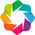

In [87]:
import pandas as pd
import numpy as np
from datetime import datetime
import holoviews as hv
hv.extension('bokeh')

In [88]:
from database.db_queries import get_all_resampled_data

In [89]:
usd_open = get_all_resampled_data(currency='EURUSD', frequency='D', begin='1970', end='2020', pricetype='open')
usd_high = get_all_resampled_data(currency='EURUSD', frequency='D', begin='1970', end='2020', pricetype='high')
usd_low = get_all_resampled_data(currency='EURUSD', frequency='D', begin='1970', end='2020', pricetype='low')
usd_close = get_all_resampled_data(currency='EURUSD', frequency='D', begin='1970', end='2020', pricetype='close')
usd_data = pd.concat([usd_open, usd_high,usd_low,usd_close], axis=1)

Got 12 EURUSD-D-open documents
Got 12 EURUSD-D-high documents
Got 12 EURUSD-D-low documents
Got 12 EURUSD-D-close documents


In [90]:
usd_data_noindx = usd_data.reset_index(inplace=False) # Holoview deletes the index -> make index a column

In [91]:
curve_dict = {pt:hv.Curve((usd_data_noindx['date'], usd_data_noindx[pt]), kdims=['date']) for pt in ['open', 'high', 'low', 'close']}

In [92]:
%%output size=150
%%opts Curve  [height=400 width=400 xaxis='bottom' tools=['hover','xbox_select']]
%%opts Curve ( line_width=.5)
%%opts Scatter  [height=400 width=400 xaxis='bottom' tools=['hover']]
%%opts Spikes  [height=400 width=400 xaxis='bottom' tools=['hover']]
%%opts Histogram  [height=400 width=400 xaxis='bottom' tools=['hover']]


In [93]:
print curve_dict

{'high': :Curve   [date]   (y), 'close': :Curve   [date]   (y), 'open': :Curve   [date]   (y), 'low': :Curve   [date]   (y)}


In [94]:
ndoverlay = hv.NdOverlay(curve_dict, kdims=['datexxx'])

In [95]:
print ndoverlay

:NdOverlay   [datexxx]
   :Curve   [date]   (y)


In [96]:
ndoverlay

:NdOverlay   [datexxx]
   :Curve   [date]   (y)

In [97]:
hmap = hv.HoloMap(curve_dict, kdims=['datexxx'])

In [98]:
hmap

:HoloMap   [datexxx]
   :Curve   [date]   (y)

In [99]:
scatter1 = hv.Scatter((usd_open,usd_close))
scatter2 = hv.Scatter((usd_low,usd_high))

In [100]:
scatter1 + scatter2

:Layout
   .Scatter.I  :Scatter   [x]   (y)
   .Scatter.II :Scatter   [x]   (y)

In [101]:
spikes= hv.Spikes(usd_close)

In [102]:
(ndoverlay+spikes).cols(2)

:Layout
   .NdOverlay.I :NdOverlay   [datexxx]
      :Curve   [date]   (y)
   .Spikes.I    :Spikes   [close]

In [103]:
ndoverlay << spikes

:AdjointLayout
   :NdOverlay   [datexxx]
      :Curve   [date]   (y)
   :Spikes   [close]

In [104]:
scatter1+scatter1.table()

:Layout
   .Scatter.I :Scatter   [x]   (y)
   .Table.I   :Table   [x]   (y)

In [105]:
img = hv.Image((range(100), range(500), np.random.rand(500, 100)), datatype=['grid'])
img

:Image   [x,y]   (z)

In [106]:
from holoviews.operation import histogram
hv.help(histogram)

Parameters of 'histogram'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                  Value          Type         Bounds     Mode  

bin_range              None      NumericTuple              V RW AN 
dimension              None         String                   V RW  
dynamic             'default'   ObjectSelector               V RW  
group              'Operation'      String                   V RW  
groupby                None     ClassSelector              V RW AN 
individually           True        Boolean        (0, 1)     V RW  
input_ranges            {}      ClassSelector                V RW  
link_inputs           False        Boolean        (0, 1)     V RW  
log                   False        Boolean        (0, 1)     V RW  
mean_weighted         False        Boolean        (0, 1)     V RW  
nonzero               False        Boolean        (0, 1

In [107]:
box = hv.BoxWhisker(usd_close.values)

In [108]:
box

:BoxWhisker   (y)

In [109]:
histop_instance = histogram.instance(num_bins=50)

In [110]:
histop_instance(box,bin_range=(float(usd_close.min()),float(usd_close.max())))

:Histogram   [y]   (Frequency)

In [111]:
xxx={y:histop_instance(hv.BoxWhisker(usd_data[datetime(y,1,1):datetime(y,12,31)].values), bin_range=(float(usd_close.min()),float(usd_close.max()))) for y in range(2004,2016)}

In [112]:
hmap = hv.HoloMap(xxx, kdims=['y'])

In [113]:
ndoverlay+hmap

:Layout
   .NdOverlay.I :NdOverlay   [datexxx]
      :Curve   [date]   (y)
   .HoloMap.I   :HoloMap   [y]
      :Histogram   [y]   (Frequency)

In [134]:
usd_close_noindx = usd_close.reset_index(inplace=False)
curve1 = hv.Curve(usd_close_noindx)
curve1

:Curve   [date]   (close)

In [135]:
from holoviews import streams
def make_from_boundsx(boundsx):
    sub = usd_close_noindx['close'].loc[boundsx[0]:boundsx[1]]
    return hv.Table(sub.describe().reset_index().values, kdims=['stat'], vdims=['value'])

In [146]:
curve1 + hv.DynamicMap(make_from_boundsx, streams=[streams.BoundsX(source=curve1, boundsx=(0,1))])

:Layout
   .Curve.I      :Curve   [date]   (close)
   .DynamicMap.I :DynamicMap   []

In [147]:
# Bug in Holoview (https://github.com/ioam/holoviews/issues/1674)
# BoundsX doesn't seem to work with datetime
# Work-around (?): create curve without datetime
curve2 = curve = hv.Curve(usd_close_noindx['close'])
curve2

:Curve   [x]   (y)

In [150]:
curve2 + hv.DynamicMap(make_from_boundsx, streams=[streams.BoundsX(source=curve2, boundsx=(0,1))])

:Layout
   .Curve.I      :Curve   [x]   (y)
   .DynamicMap.I :DynamicMap   []